In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import random
from skimage.util import random_noise

In [2]:
# Load the image
img = cv2.imread(r"D:\Malathi\SEM_6\IVP\1.jpg")
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

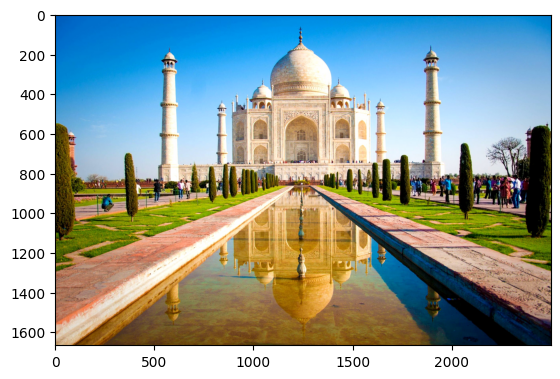

In [3]:
plt.imshow(img)

### GAUSSIAN NOISE

uint8


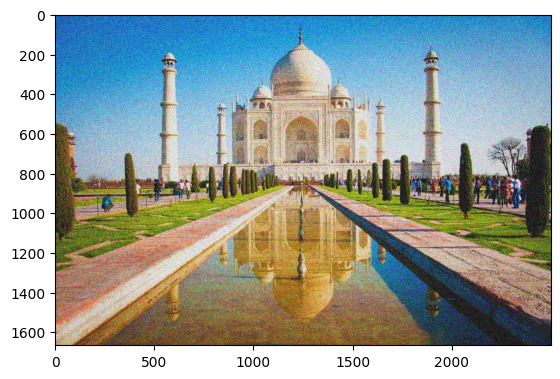

In [7]:
def generate_gaussian_noise(shape, intensity):
    row, col, ch = shape
    mean = 0
    sigma = intensity
    gauss = np.random.normal(mean, sigma, (row, col, ch)).astype(np.uint8)
    return gauss

noise = generate_gaussian_noise(img.shape, 10)
gausnoisy_img = cv2.add(img, noise)
g1 = random_noise(img,mode = 'gaussian', var = 0.1)
plt.imshow(g1)
print(img.dtype)

### UNIFORM NOISE

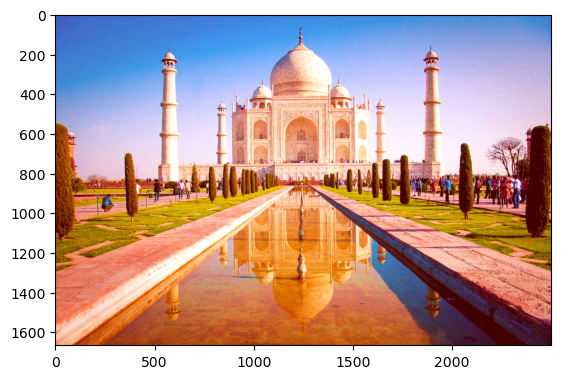

In [44]:
uni_noise = np.zeros((1666, 2500, 3),dtype=np.uint8)
cv2.randu(uni_noise,0,255)
uni_noise = (uni_noise*0.5).astype(np.uint8)

uninoisy_img = cv2.add(img, uni_noise)
plt.imshow(uninoisy_img)

### SALT AND PEPPER NOISE

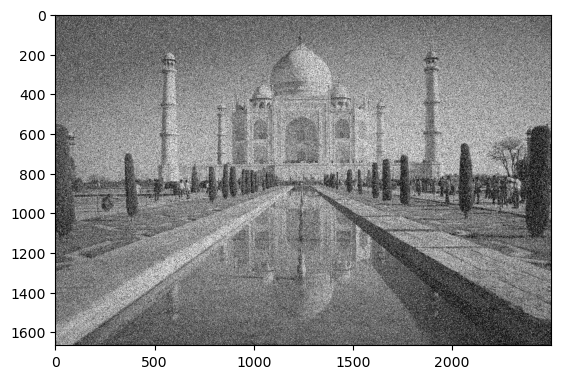

In [45]:
def add_salt_and_pepper_noise(image, salt_prob, pepper_prob):
    noisy_image = np.copy(image)
    row, col = noisy_image.shape  # For grayscale, no need for the third dimension
    # Add salt noise
    num_salt = np.ceil(salt_prob * row * col)
    salt_coords = [np.random.randint(0, i - 1, int(num_salt))
                  for i in noisy_image.shape]
    noisy_image[salt_coords[0], salt_coords[1]] = 255
    
    # Add pepper noise
    num_pepper = np.ceil(pepper_prob * row * col)
    pepper_coords = [np.random.randint(0, i - 1, int(num_pepper))
                    for i in noisy_image.shape]
    noisy_image[pepper_coords[0], pepper_coords[1]] = 0
    
    return noisy_image

# Load an image
gimg = cv2.imread(r"D:\Malathi\SEM_6\IVP\1.jpg", cv2.IMREAD_GRAYSCALE) 

# Define probabilities for salt and pepper noise
salt_prob = 0.3
pepper_prob = 0.3

# Add salt and pepper noise
spnoisy_image = add_salt_and_pepper_noise(gimg, salt_prob, pepper_prob)

# Display the original and noisy images
plt.imshow(spnoisy_image, cmap = 'gray')


### GAUSSIAN BLUR

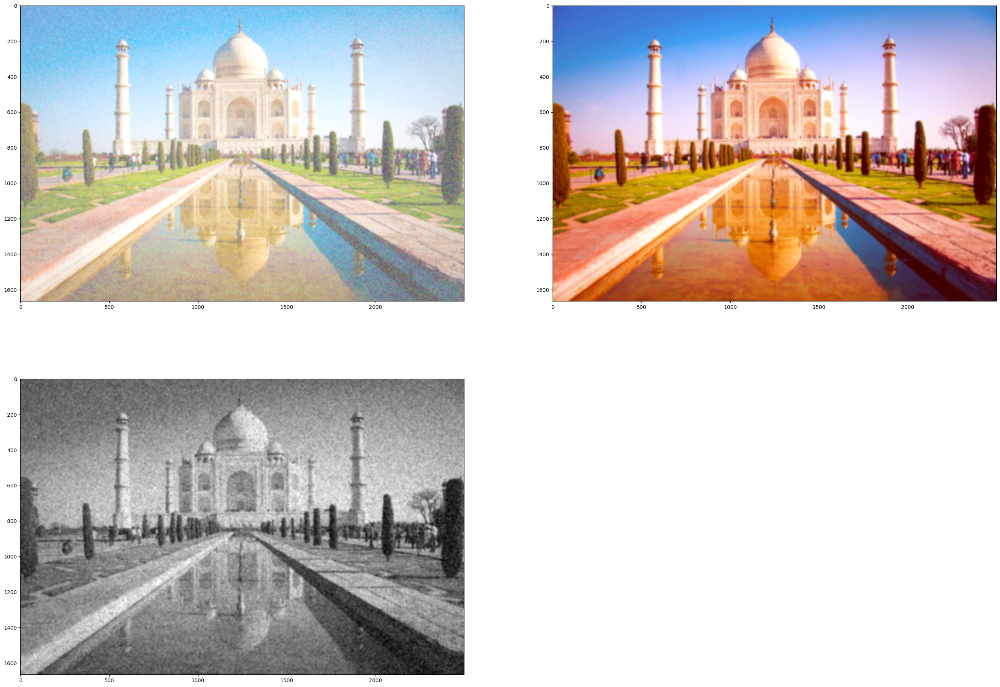

In [46]:
gblur1 = cv2.GaussianBlur(gausnoisy_img, (21,21), 0)
gblur2 = cv2.GaussianBlur(uninoisy_img, (25, 25), 0)
gblur3 = cv2.GaussianBlur(spnoisy_image, (25, 25), 0)

plt.figure(figsize=(34, 24))
plt.subplot(2,2, 1)
plt.imshow(gblur1)
plt.subplot(2,2, 2)
plt.imshow(gblur2)
plt.subplot(2,2, 3)
plt.imshow(gblur3, cmap = 'gray')

### MEDIAN BLUR

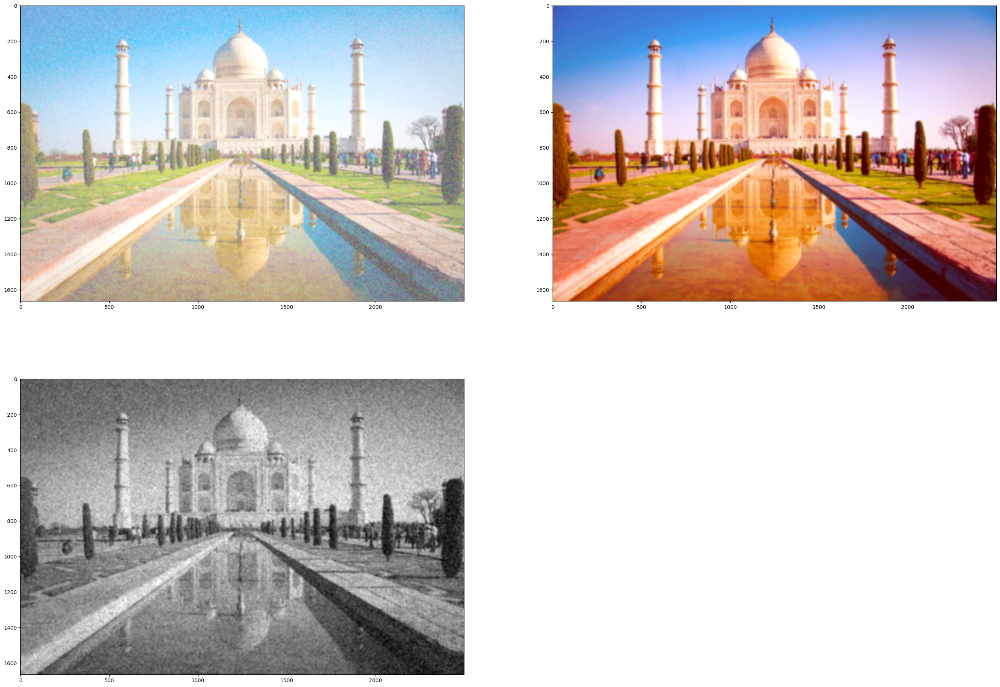

In [47]:
median_blur1 = cv2.medianBlur(gausnoisy_img, 21)
median_blur2 = cv2.medianBlur(uninoisy_img, 21)
median_blur3 = cv2.medianBlur(spnoisy_image, 21)

plt.figure(figsize=(34, 24))
plt.subplot(2,2, 1)
plt.imshow(gblur1)
plt.subplot(2,2, 2)
plt.imshow(gblur2)
plt.subplot(2,2, 3)
plt.imshow(gblur3, cmap = 'gray')

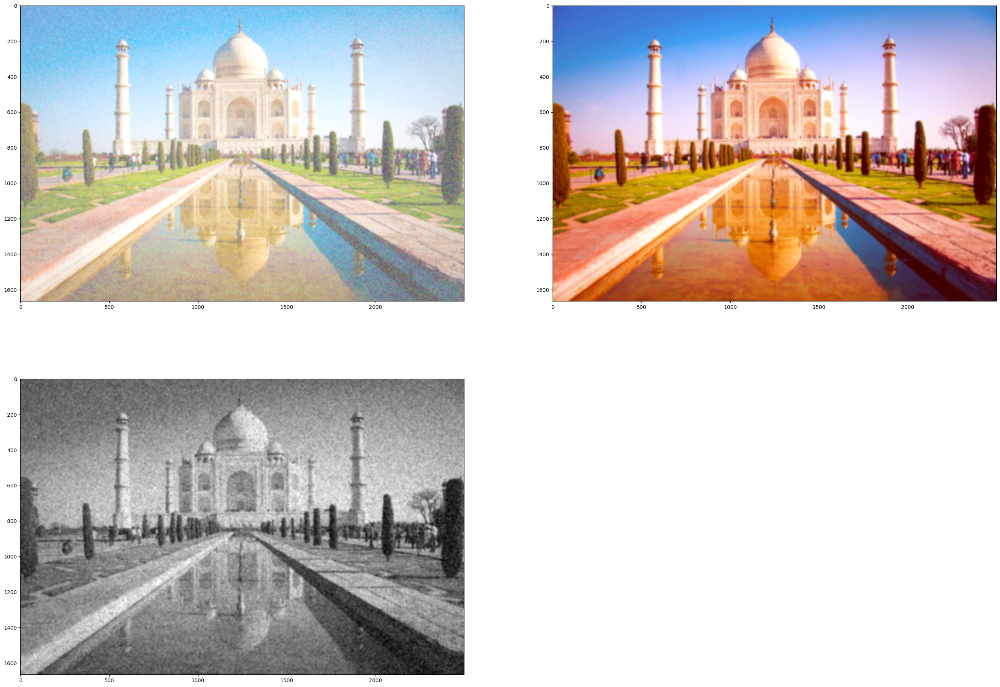

In [48]:
mean_blur1 = cv2.blur(gausnoisy_img, (5, 5))
mean_blur2 = cv2.blur(uninoisy_img, (5, 5))
mean_blur3 = cv2.blur(spnoisy_image, (5, 5))

plt.figure(figsize=(34, 24))
plt.subplot(2,2, 1)
plt.imshow(gblur1)
plt.subplot(2,2, 2)
plt.imshow(gblur2)
plt.subplot(2,2, 3)
plt.imshow(gblur3, cmap = 'gray')

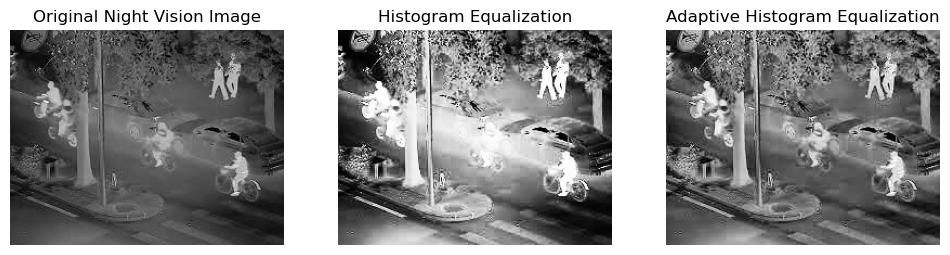

In [50]:
night_vision_image = cv2.imread(r"D:\Malathi\SEM_6\IVP\NightVision.jpg", cv2.IMREAD_GRAYSCALE)

# histogram equalization
equalized_image = cv2.equalizeHist(night_vision_image)

# adaptive histogram equalization
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
clahe_image = clahe.apply(night_vision_image)

plt.figure(figsize=(12, 6))

plt.subplot(1, 3, 1)
plt.imshow(night_vision_image, cmap='gray')
plt.title('Original Night Vision Image')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(equalized_image, cmap='gray')
plt.title('Histogram Equalization')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(clahe_image, cmap='gray')
plt.title('Adaptive Histogram Equalization')
plt.axis('off')

plt.show()